In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import boto3
from botocore.client import Config
import os
import pandas as pd
from io import StringIO
import matplotlib.dates as dates
from datetime import datetime
import matplotlib.ticker as ticker
from random import shuffle
from time import time
from pandas.plotting import register_matplotlib_converters
%matplotlib notebook

os.chdir('C:\\Users\\A Sua\\Documents\\AWS\\credentials')
list_of_lines = []
with open('capstoner_key.txt') as fp:
    lines = fp.readlines()
    for line in lines:
        line = line.strip()
        list_of_lines.append(line)
    fp.close()


location = list_of_lines[0].split('=')[1]
AWS_ACCESS_KEY_ID = list_of_lines[1].split('=')[1]
AWS_SECRET_ACCESS_KEY = list_of_lines[2].split('=')[1]
os.chdir('C:\\Users\\A Sua\\Documents\\FIU\\CAP2020')

In [59]:
register_matplotlib_converters()
%matplotlib notebook

### import price

In [22]:
### BUCKETS & KEYS
BUCKET_NAME = 'capstonefiu2020-data'
key_location = 'data/processed'
file_name = 'df_price07_18.csv'
key_path = key_location + '/' + file_name

### ACTIVATE CLIENT
client = boto3.client('s3', 
              aws_access_key_id = AWS_ACCESS_KEY_ID,
               aws_secret_access_key=AWS_SECRET_ACCESS_KEY)


### INSTANTIATE DATAFRAME
csv_obj = client.get_object(Bucket = BUCKET_NAME, Key=key_path)
body = csv_obj['Body']
csv_string = body.read().decode('utf-8')

df_price = pd.read_csv(StringIO(csv_string))
df_price.index = df_price['Unnamed: 0']
df_price = df_price.drop('Unnamed: 0', axis=1)
df_price.index.names = ['date']


#df_bidlo.head()
#### TRANSPOSE DATA FOR EASE OF USE
df_price = df_price.T
df_price.index = pd.to_datetime(df_price.index)
print(df_price.shape)
df_price.head()

(3020, 388)


date,ORCL_ORACLE CORP,MSFT_MICROSOFT CORP,TROW_T ROWE PRICE GROUP INC,HON_HONEYWELL INTERNATIONAL INC,ADM_ARCHER DANIELS MIDLAND CO,FISV_FISERV INC,CERN_CERNER CORP,KO_COCA COLA CO,CDNS_CADENCE DESIGN SYSTEMS INC,ED_CONSOLIDATED EDISON INC,...,ROST_ROSS STORES INC,IPGP_I P G PHOTONICS CORP,UNH_UNITED HEALTHCARE,UA_UNDER ARMOUR INC,MKC_MCCORMICK & CO INC,LEN_LENNAR CORP,TAP_MOLSON COORS BREWING CO,STZ_CONSTELLATION BRANDS INC,CBS_CBS CORP,CMG_CHIPOTLE MEXICAN GRILL INC
2007-01-03,17.51,29.86,45.75,45.10,32.06,51.57,45.20,48.58,18.15,48.39,...,30.49,24.09,52.57,49.55,38.40,50.63,78.02,29.140,31.60,56.41
2007-01-04,17.68,29.81,46.15,45.08,31.88,52.66,46.50,48.60,18.02,48.31,...,31.21,24.09,52.91,49.23,38.22,50.09,76.55,25.493,31.33,55.38
2007-01-05,17.64,29.64,46.06,44.65,31.83,52.46,45.46,48.26,18.06,47.63,...,31.41,24.82,52.55,48.36,37.99,49.66,76.00,24.410,30.91,55.00
2007-01-08,17.86,29.93,46.90,44.92,31.99,52.59,45.30,48.57,18.03,47.56,...,31.59,24.66,53.32,48.99,37.90,48.72,76.17,24.710,31.05,56.05
2007-01-09,17.82,29.96,47.09,45.24,31.21,52.75,45.34,48.61,18.13,47.70,...,31.98,25.70,52.68,48.87,38.03,48.78,75.59,24.730,30.90,56.45


### import returns

In [23]:
### BUCKETS & KEYS
BUCKET_NAME = 'capstonefiu2020-data'
key_location = 'data/processed'
file_name = 'df_returns07_18.csv'
key_path = key_location + '/' + file_name

### ACTIVATE CLIENT
client = boto3.client('s3', 
              aws_access_key_id = AWS_ACCESS_KEY_ID,
               aws_secret_access_key=AWS_SECRET_ACCESS_KEY)


### INSTANTIATE DATAFRAME
csv_obj = client.get_object(Bucket = BUCKET_NAME, Key=key_path)
body = csv_obj['Body']
csv_string = body.read().decode('utf-8')

df_returns = pd.read_csv(StringIO(csv_string))
df_returns.index = df_returns['Unnamed: 0']
df_returns = df_returns.drop('Unnamed: 0', axis=1)
df_returns.index.names = ['date']


#df_bidlo.head()
#### TRANSPOSE DATA FOR EASE OF USE
df_returns = df_returns.T
df_returns.index = pd.to_datetime(df_returns.index)
print(df_returns.shape)
df_returns.head()

(3020, 388)


date,ORCL_ORACLE CORP,MSFT_MICROSOFT CORP,TROW_T ROWE PRICE GROUP INC,HON_HONEYWELL INTERNATIONAL INC,ADM_ARCHER DANIELS MIDLAND CO,FISV_FISERV INC,CERN_CERNER CORP,KO_COCA COLA CO,CDNS_CADENCE DESIGN SYSTEMS INC,ED_CONSOLIDATED EDISON INC,...,ROST_ROSS STORES INC,IPGP_I P G PHOTONICS CORP,UNH_UNITED HEALTHCARE,UA_UNDER ARMOUR INC,MKC_MCCORMICK & CO INC,LEN_LENNAR CORP,TAP_MOLSON COORS BREWING CO,STZ_CONSTELLATION BRANDS INC,CBS_CBS CORP,CMG_CHIPOTLE MEXICAN GRILL INC
2007-01-03,0.021587,0.000000,0.045236,-0.003095,0.003129,-0.016215,-0.006593,0.006839,0.013400,0.006657,...,0.040614,0.003750,-0.021589,-0.017839,-0.004149,-0.034884,0.020670,0.002408,0.013470,0.013462
2007-01-04,0.009709,-0.001675,0.008743,-0.000443,-0.005615,0.021136,0.028761,0.000412,-0.007162,-0.001653,...,0.023614,0.000000,0.006468,-0.006458,-0.004688,-0.010666,-0.005844,-0.114437,-0.008544,-0.018259
2007-01-05,-0.002262,-0.005703,-0.001950,-0.009539,-0.001568,-0.003798,-0.022366,-0.006996,0.002220,-0.014076,...,0.006408,0.030303,-0.006804,-0.017672,-0.003150,-0.008585,-0.007185,-0.029423,-0.012144,-0.006862
2007-01-08,0.012472,0.009784,0.018237,0.006047,0.005027,0.002478,-0.003520,0.006424,-0.001661,-0.001470,...,0.005731,-0.006446,0.014653,0.013027,-0.002369,-0.017699,0.009677,0.014021,0.005180,0.019091
2007-01-09,-0.002240,0.001002,0.004051,0.007124,-0.024383,0.003042,0.000883,0.000824,0.005546,0.002944,...,0.012346,0.042174,-0.012003,-0.002450,0.003430,0.006153,-0.000395,0.005693,-0.004510,0.014644


### Dates

In [25]:
dates = df_price.index

### Worst Dates Dow/S&P

In [4]:
worst_dates_dow = pd.to_datetime(['2008-10-15', '2008-12-1', '2008-10-9', '2008-9-29', '2011-8-8'])
#worst_dates_sp = 
worst_dates_dow

DatetimeIndex(['2008-10-15', '2008-12-01', '2008-10-09', '2008-09-29',
               '2011-08-08'],
              dtype='datetime64[ns]', freq=None)

### Import Returns: 
### What were the prices on the 5 worst days of each company's returns?

#### Dictionary of Returns on 5 worst dates for each Company

In [56]:
worst_days_returns = {}
for symbol in df_returns.columns:
    temp_series = df_returns[symbol].sort_values(ascending=True).iloc[:5]
    worst_days_returns[symbol] = temp_series
worst_days_returns

{'ORCL_ORACLE CORP': 2011-12-21   -0.116558
 2008-10-15   -0.098361
 2013-03-21   -0.096882
 2018-03-20   -0.094321
 2013-06-21   -0.092593
 Name: ORCL_ORACLE CORP, dtype: float64,
 'MSFT_MICROSOFT CORP': 2009-01-22   -0.117131
 2013-07-19   -0.113995
 2015-01-27   -0.092533
 2008-09-29   -0.087226
 2009-07-24   -0.082551
 Name: MSFT_MICROSOFT CORP, dtype: float64,
 'TROW_T ROWE PRICE GROUP INC': 2008-09-29   -0.179386
 2008-12-01   -0.171295
 2008-10-15   -0.155755
 2008-10-09   -0.131379
 2008-10-22   -0.110538
 Name: TROW_T ROWE PRICE GROUP INC, dtype: float64,
 'HON_HONEYWELL INTERNATIONAL INC': 2008-10-15   -0.094081
 2008-11-06   -0.088738
 2008-09-29   -0.086031
 2008-10-09   -0.078932
 2011-08-08   -0.076907
 Name: HON_HONEYWELL INTERNATIONAL INC, dtype: float64,
 'ADM_ARCHER DANIELS MIDLAND CO': 2008-11-06   -0.144243
 2008-11-19   -0.141528
 2009-01-14   -0.130201
 2008-10-02   -0.125642
 2008-10-15   -0.111050
 Name: ADM_ARCHER DANIELS MIDLAND CO, dtype: float64,
 'FISV_FISE

In [39]:
temp_dic = worst_days_returns['MSFT_MICROSOFT CORP']
temp_dic

2009-01-22   -0.117131
2013-07-19   -0.113995
2015-01-27   -0.092533
2008-09-29   -0.087226
2009-07-24   -0.082551
Name: MSFT_MICROSOFT CORP, dtype: float64

In [37]:
#sum(df_returns.columns==df_price.columns)

In [53]:
worst_days_prices = {}
for symbol in df_price:
    temp_dic = worst_days_returns[symbol]
    temp_series = pd.merge(temp_dic, df_price[symbol], left_index=True, right_index=True, copy=False, suffixes=('_x', ''))[symbol]
    worst_days_prices[symbol] = temp_series
worst_days_prices

{'ORCL_ORACLE CORP': 2011-12-21    25.770
 2008-10-15    15.950
 2013-03-21    32.300
 2018-03-20    47.050
 2013-06-21    30.135
 Name: ORCL_ORACLE CORP, dtype: float64,
 'MSFT_MICROSOFT CORP': 2009-01-22    17.11
 2013-07-19    31.40
 2015-01-27    42.66
 2008-09-29    25.01
 2009-07-24    23.45
 Name: MSFT_MICROSOFT CORP, dtype: float64,
 'TROW_T ROWE PRICE GROUP INC': 2008-09-29    50.00
 2008-12-01    28.35
 2008-10-15    36.75
 2008-10-09    40.00
 2008-10-22    32.75
 Name: TROW_T ROWE PRICE GROUP INC, dtype: float64,
 'HON_HONEYWELL INTERNATIONAL INC': 2008-10-15    29.08
 2008-11-06    28.24
 2008-09-29    40.37
 2008-10-09    31.39
 2011-08-08    44.29
 Name: HON_HONEYWELL INTERNATIONAL INC, dtype: float64,
 'ADM_ARCHER DANIELS MIDLAND CO': 2008-11-06    20.29
 2008-11-19    22.14
 2009-01-14    24.25
 2008-10-02    18.72
 2008-10-15    16.09
 Name: ADM_ARCHER DANIELS MIDLAND CO, dtype: float64,
 'FISV_FISERV INC': 2008-10-15    36.97
 2008-10-29    30.48
 2008-09-29    45.88

#### Dictionary of Returns on 5 worst Market trading dates 

In [51]:
#pd.Series([df_price['MSFT_MICROSOFT CORP'][worst_dates_dow[i]] for i in range(len(worst_dates_dow))], index=[worst_dates_dow])

In [50]:
worst_days_sys_prices = {}
for symbol in df_price.columns:
    temp_series = pd.Series([df_price[symbol][worst_dates_dow[i]] for i in range(len(worst_dates_dow))], index=[worst_dates_dow])
    worst_days_sys_prices[symbol] = temp_series

worst_days_sys_prices['HON_HONEYWELL INTERNATIONAL INC']

2008-10-15    29.08
2008-12-01    25.99
2008-10-09    31.39
2008-09-29    40.37
2011-08-08    44.29
dtype: float64

In [84]:
# ### company prices, worst 5 dates with worst returns
# temp_worst_prices = worst_days_prices['HON_HONEYWELL INTERNATIONAL INC']
# ### comapny returns, worst 5 systemic dates with worst returns
# temp_worst_prices_sys = worst_days_sys_prices['HON_HONEYWELL INTERNATIONAL INC']

# fig, ax = plt.subplots(1,1, figsize=(5,5))
# ax.plot(dates, df_price['HON_HONEYWELL INTERNATIONAL INC'].values, label='Daily Price'.format(symbol), alpha=0.7) 


# wc = ax.scatter(temp_worst_prices.index, temp_worst_prices.values, 
#            color='red', 
#            linewidths=red_dot, 
#            edgecolor='red')

# wm = ax.scatter(temp_worst_prices_sys.index, temp_worst_prices_sys.values, 
#            color='black', 
#            linewidths=black_dot, 
#            edgecolor='black') 

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.set_title(symbol, fontsize=sub_title_font)

# ax.tick_params(axis="x", labelsize=axis_font, rotation=tick_rotation)
# ax.tick_params(axis="y", labelsize=axis_font)
# ax.set_ylim([-0.45, 0.45])     

# plt.show()

<IPython.core.display.Javascript object>


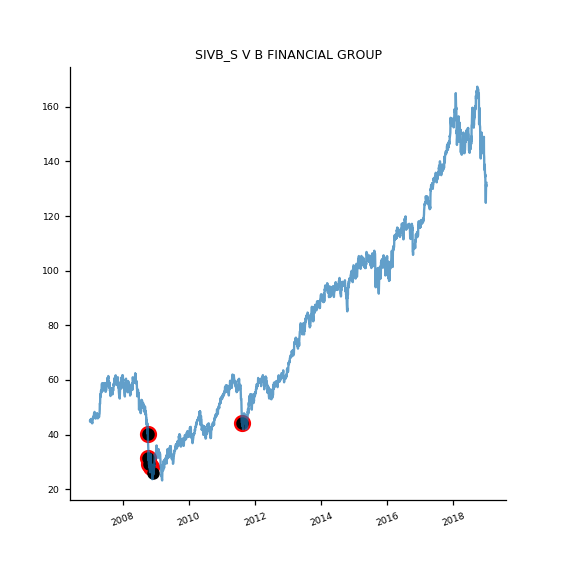

In [78]:
### company prices, worst 5 dates with worst returns
temp_worst_prices = worst_days_prices['HON_HONEYWELL INTERNATIONAL INC']
### comapny returns, worst 5 systemic dates with worst returns
temp_worst_prices_sys = worst_days_sys_prices['HON_HONEYWELL INTERNATIONAL INC']
sub_title_font =8
legend_font =8
axis_font = 6
tick_rotation = 20
black_dot = 2
red_dot = 5



fig, ax = plt.subplots(1,1, figsize=(5,5))

### Company Timeseries            
wt = ax.plot(dates, df_price['HON_HONEYWELL INTERNATIONAL INC'].values, label='Daily Price'.format(symbol), alpha=0.7)            

### PLOT: 5 worst company dates
wc = ax.scatter(temp_worst_prices.index, temp_worst_prices.values, 
           color='red', 
           linewidths=red_dot, 
           edgecolor='red') 
           #label='Worst Company Trading')
### PLOT: Returns on 5 worst systemic dates 
wm = ax.scatter(temp_worst_prices_sys.index, temp_worst_prices_sys.values, 
           color='black', 
           linewidths=black_dot, 
           edgecolor='black') 
           #label='Worst Market Trading Days')            



ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title(symbol, fontsize=sub_title_font) 
#ax[k,l].set_xlabel(fontsize=x_axis_font)
ax.tick_params(axis="x", labelsize=axis_font, rotation=tick_rotation)
ax.tick_params(axis="y", labelsize=axis_font)
# ax.set_ylim([-0.45, 0.45])            
# temp_list_of_axis.append([wc, wm, wt])
plt.show()

### Grid Plot of Price for Each Company 384 Plots (16 graph per plot)
#### the leftovers are plotted in the leftovers









Batch 0


<IPython.core.display.Javascript object>


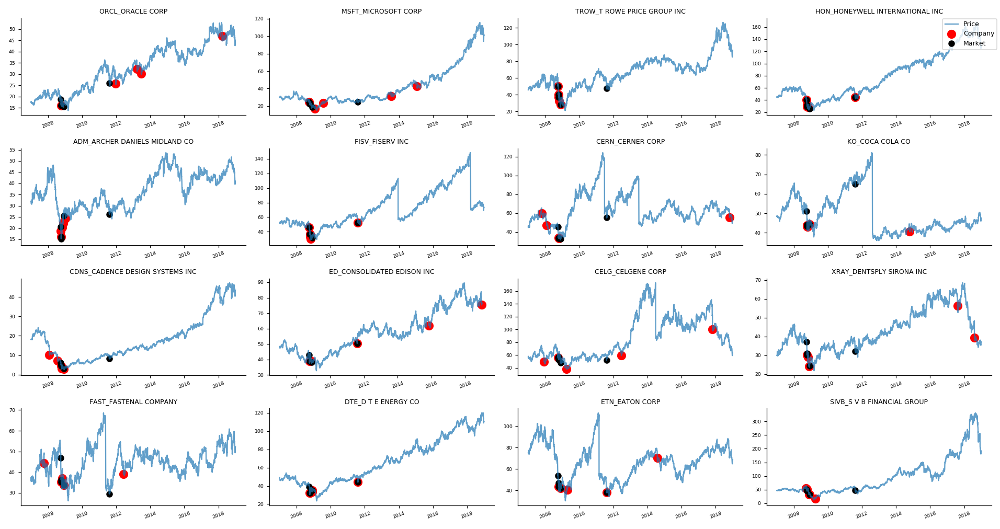

C:\PROGRA1\Anaconda3\lib\site-packages\ipykernel\__main__.py:77: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.










Batch 1


<IPython.core.display.Javascript object>


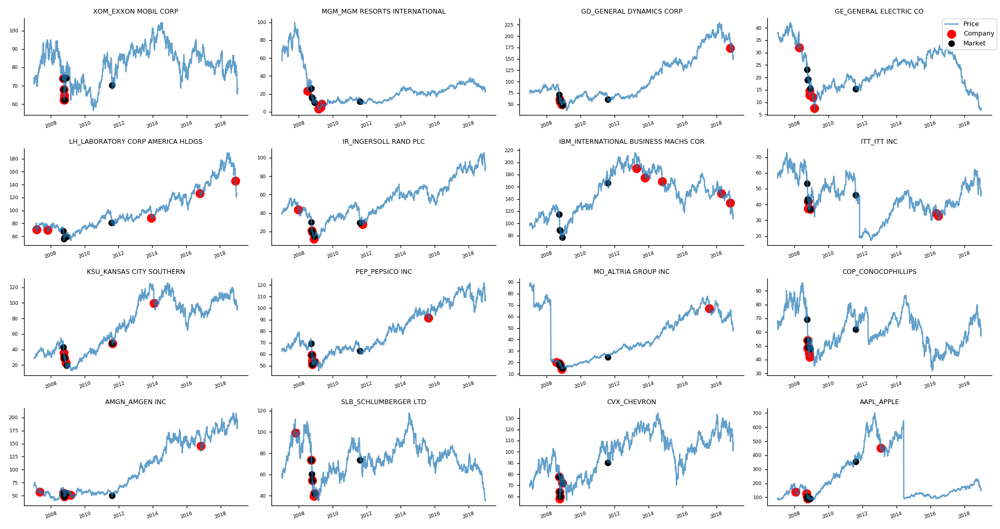









Batch 2


<IPython.core.display.Javascript object>


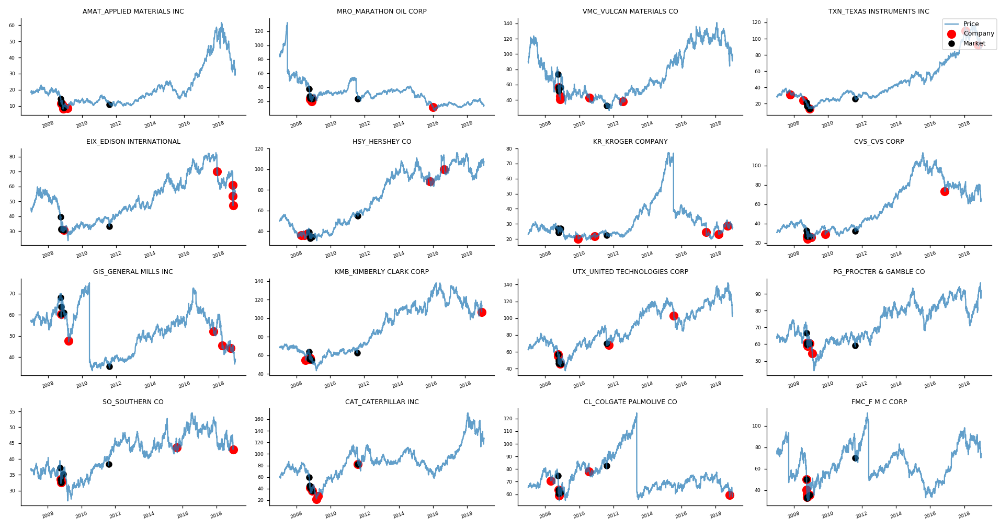









Batch 3


<IPython.core.display.Javascript object>


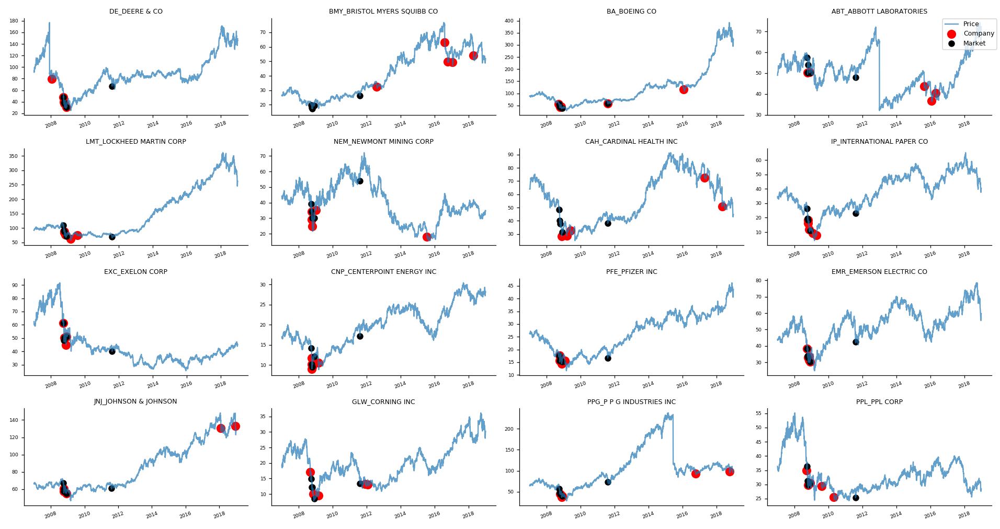









Batch 4


<IPython.core.display.Javascript object>


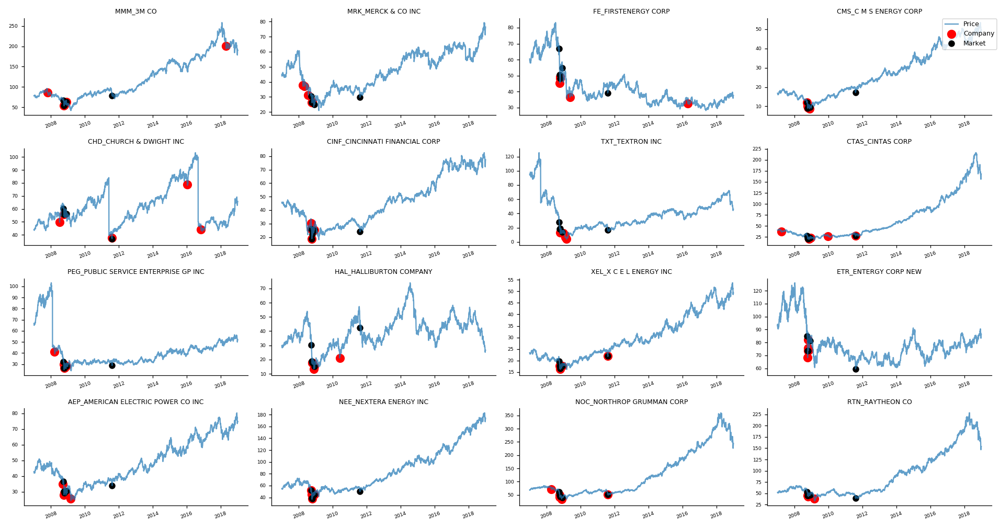









Batch 5


<IPython.core.display.Javascript object>


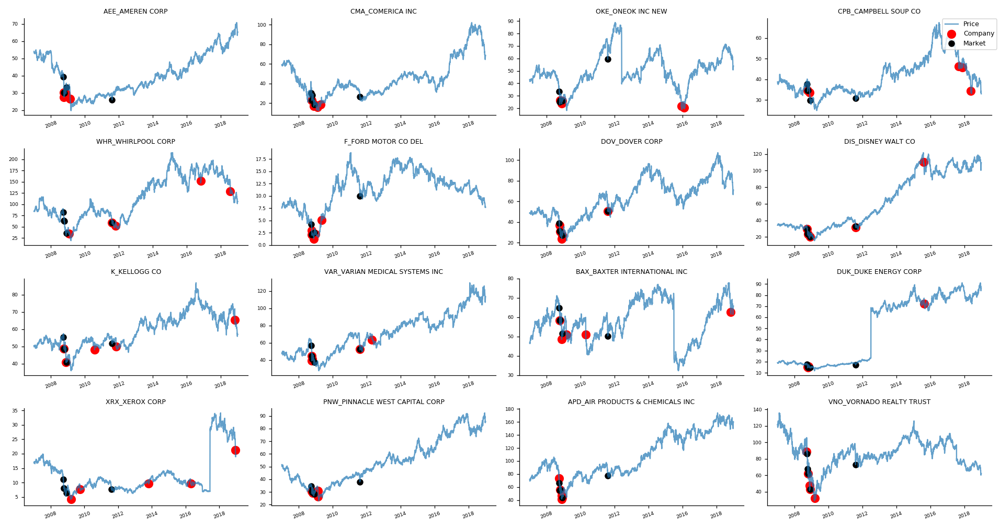









Batch 6


<IPython.core.display.Javascript object>


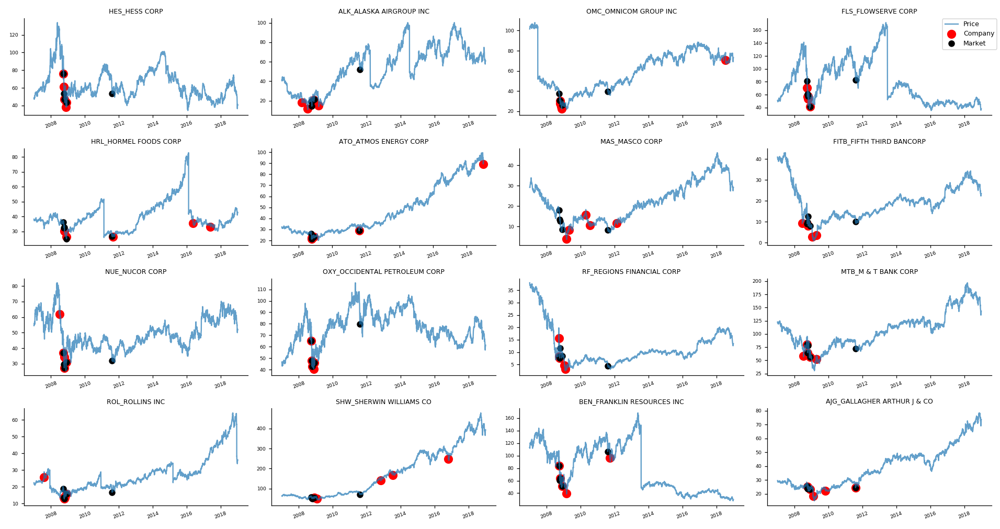









Batch 7


<IPython.core.display.Javascript object>


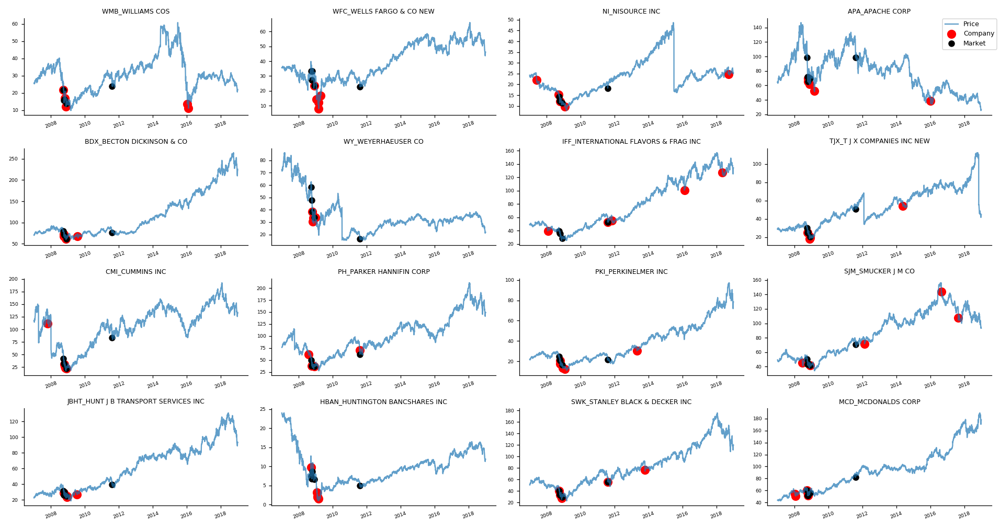









Batch 8


<IPython.core.display.Javascript object>


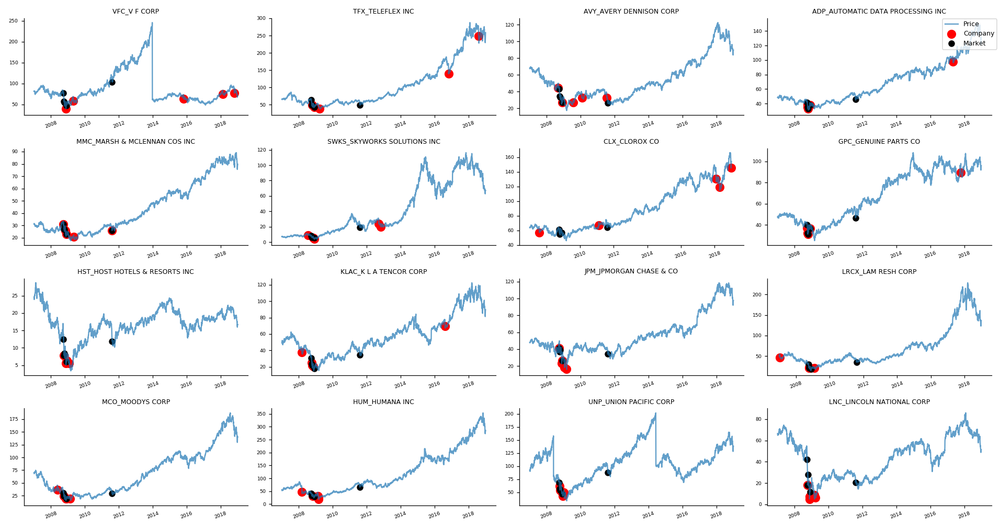









Batch 9


<IPython.core.display.Javascript object>


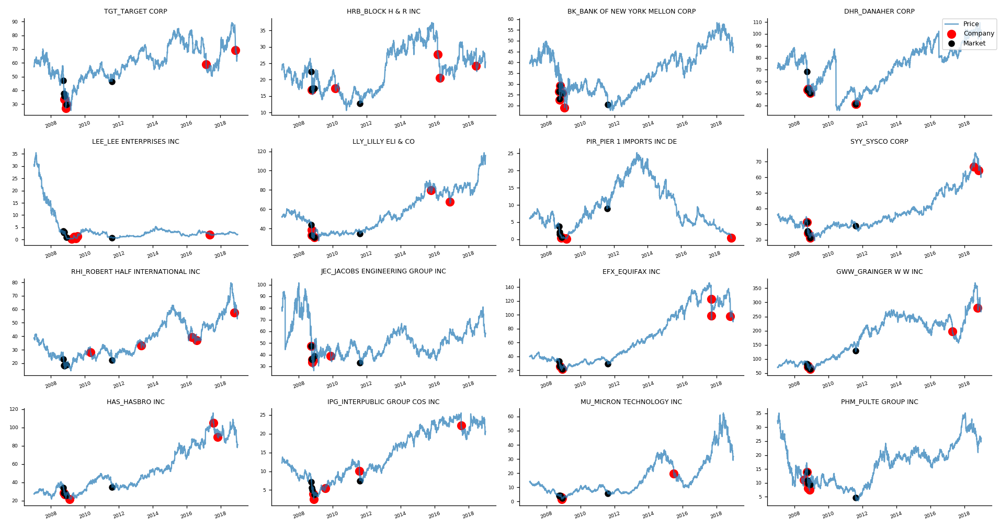









Batch 10


<IPython.core.display.Javascript object>


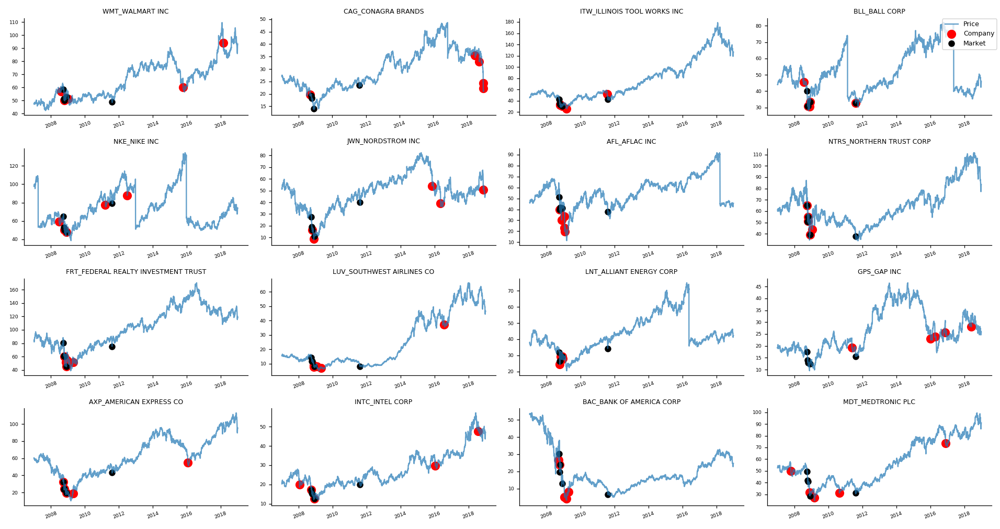









Batch 11


<IPython.core.display.Javascript object>


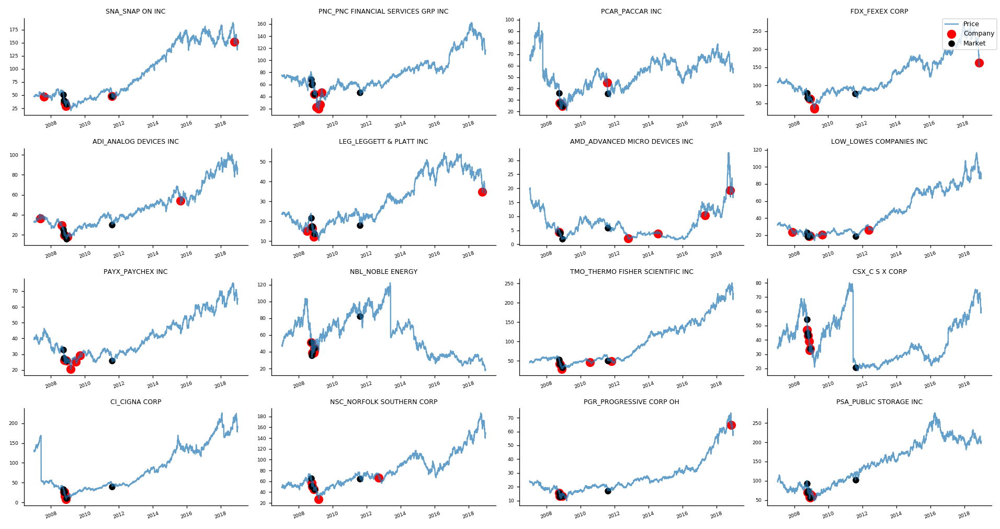









Batch 12


<IPython.core.display.Javascript object>


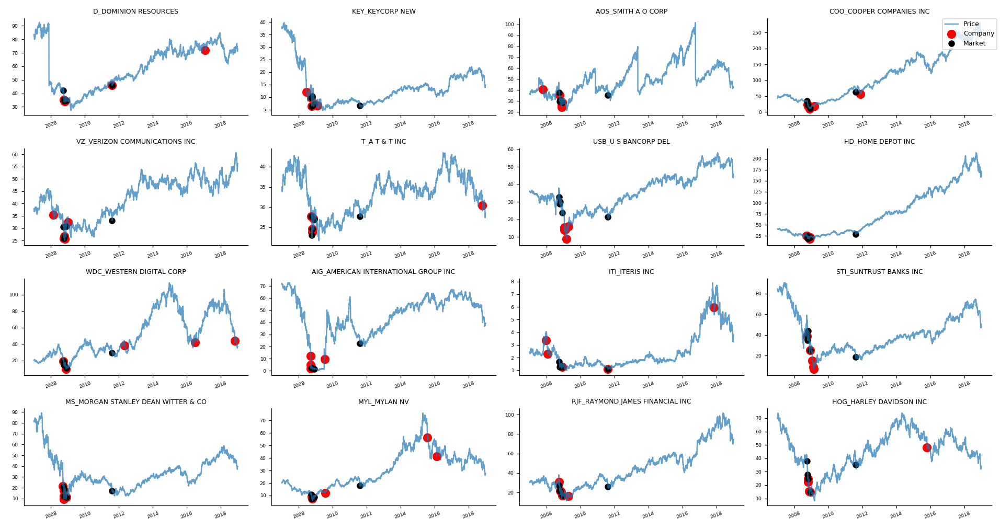









Batch 13


<IPython.core.display.Javascript object>


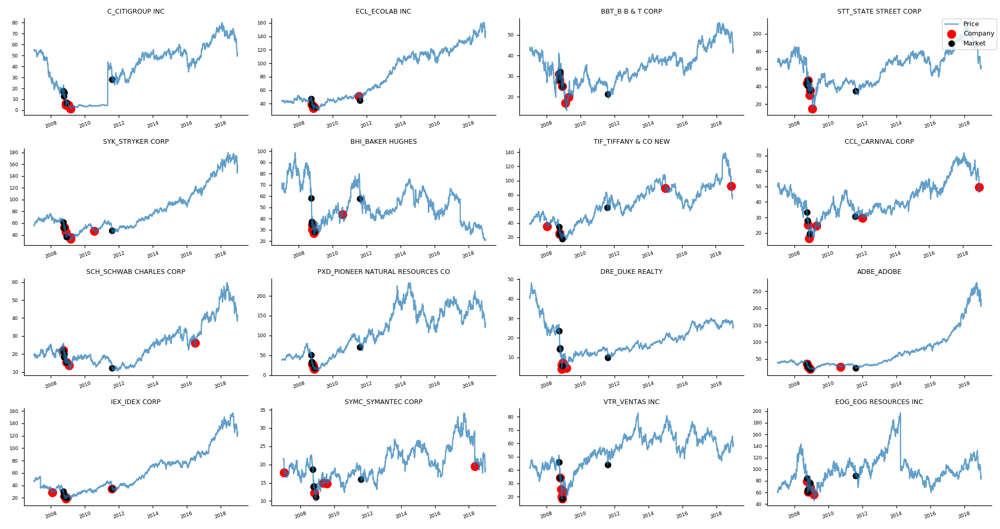









Batch 14


<IPython.core.display.Javascript object>


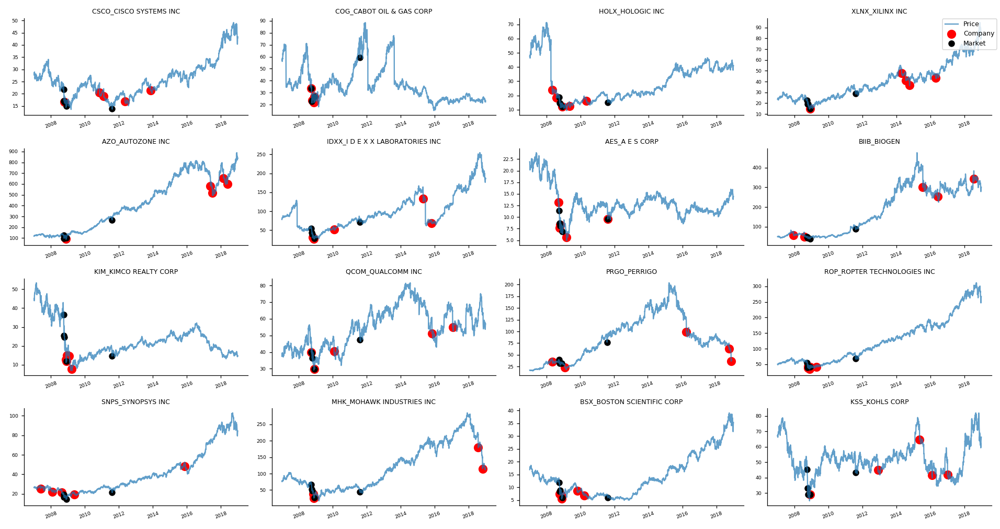









Batch 15


<IPython.core.display.Javascript object>


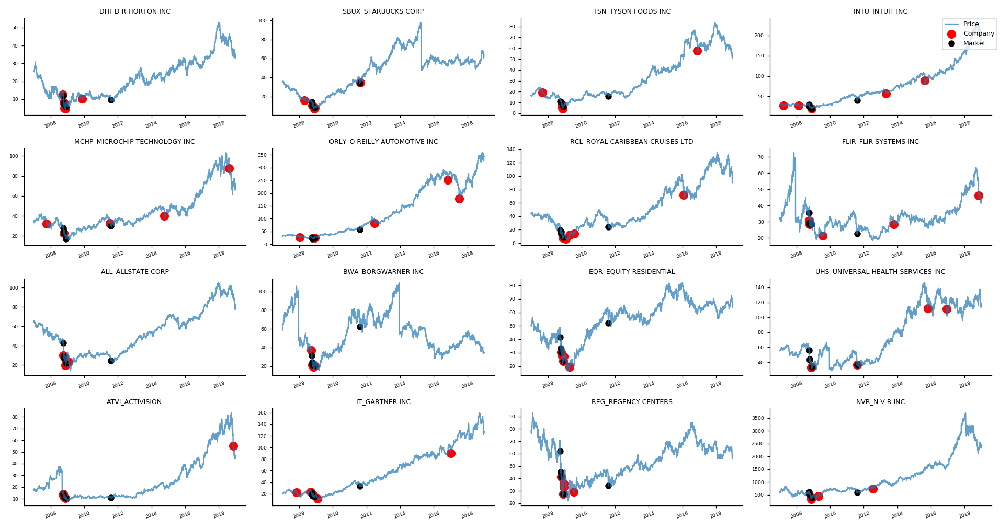









Batch 16


<IPython.core.display.Javascript object>


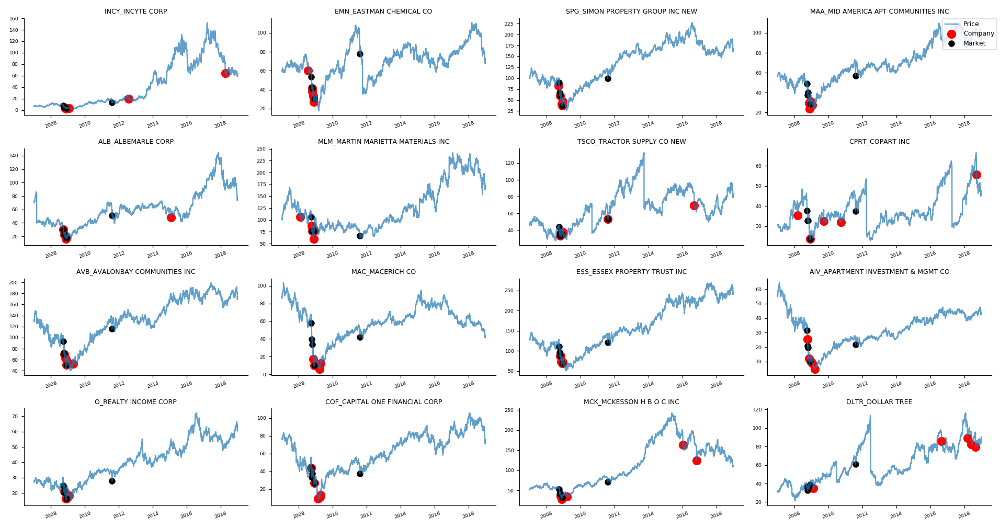









Batch 17


C:\PROGRA1\Anaconda3\lib\site-packages\ipykernel\__main__.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


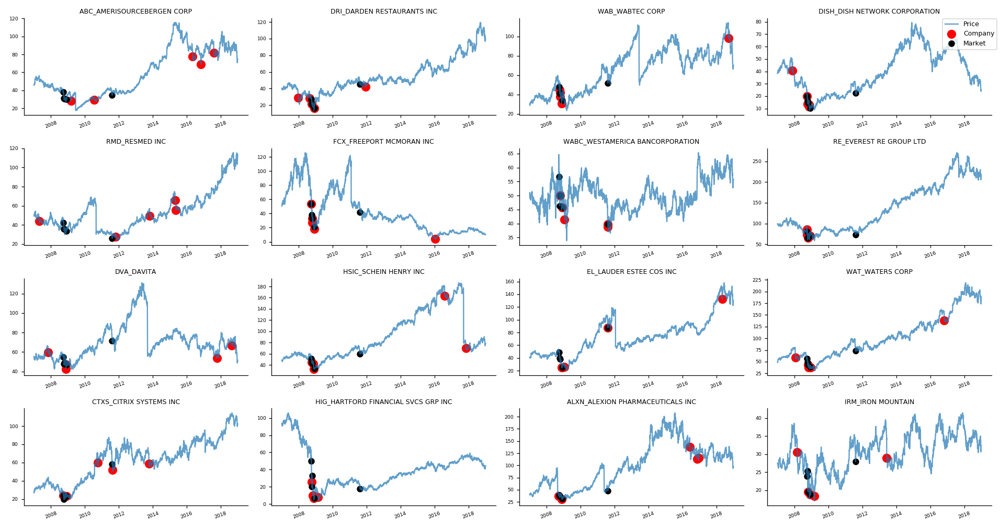









Batch 18


<IPython.core.display.Javascript object>


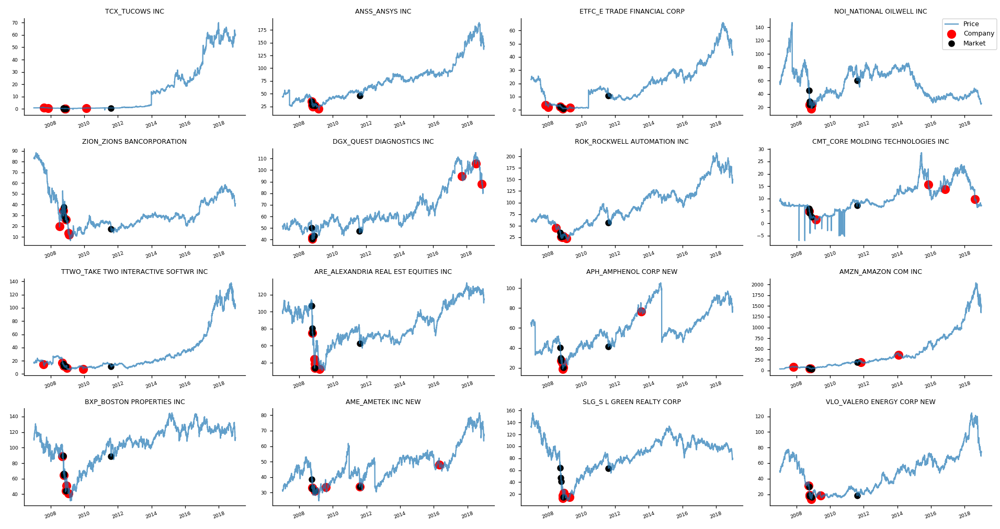









Batch 19


<IPython.core.display.Javascript object>


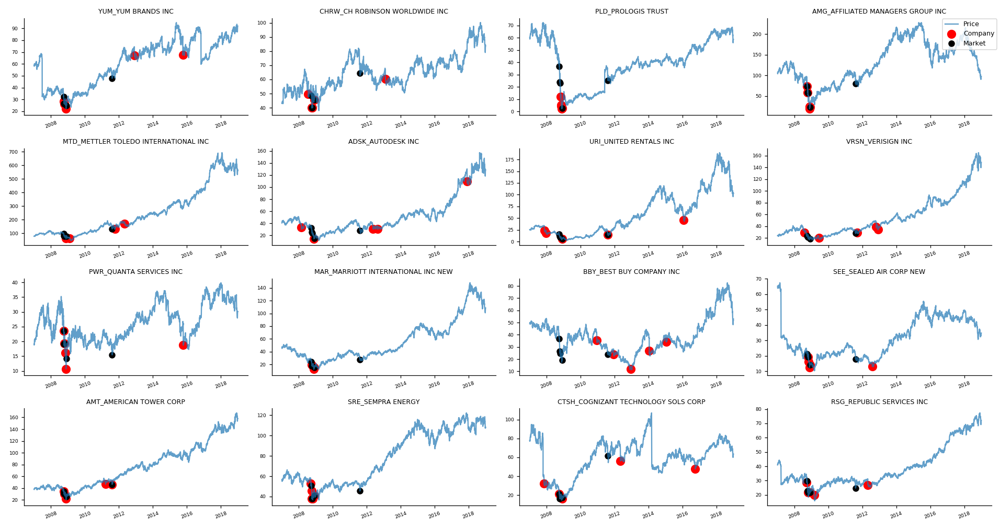









Batch 20


<IPython.core.display.Javascript object>


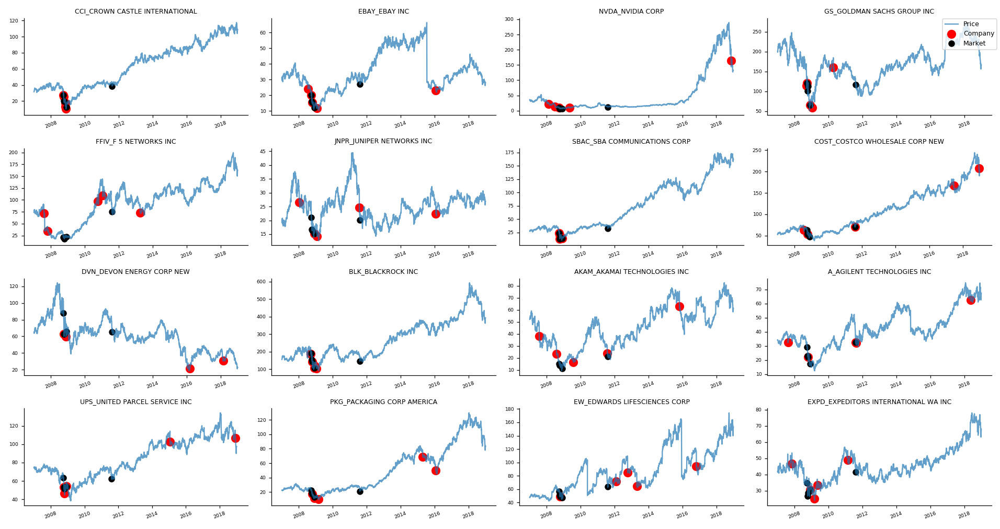









Batch 21


<IPython.core.display.Javascript object>


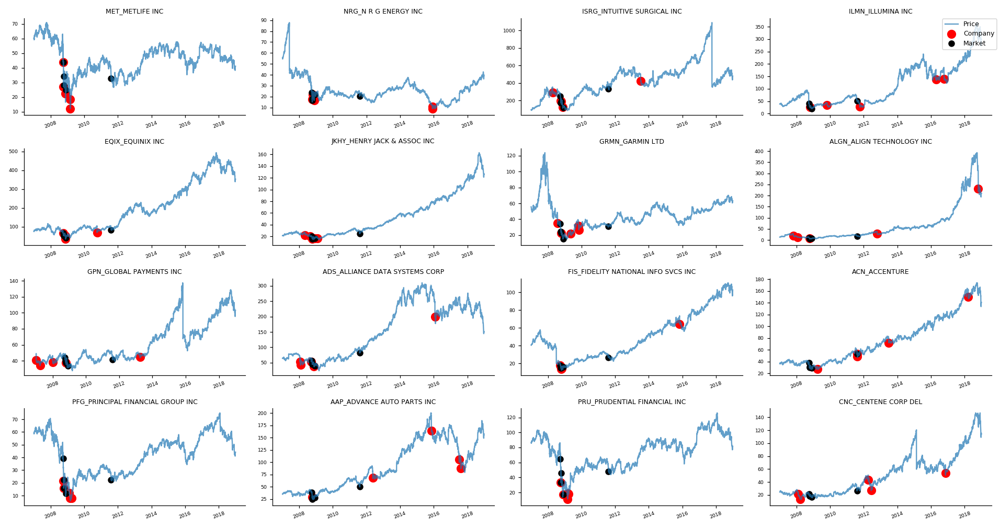









Batch 22


<IPython.core.display.Javascript object>


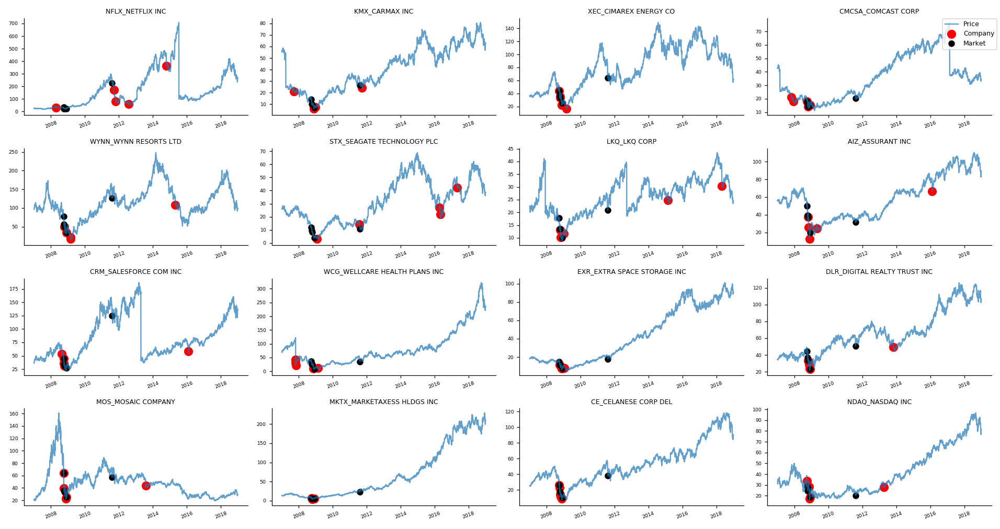









Batch 23


<IPython.core.display.Javascript object>


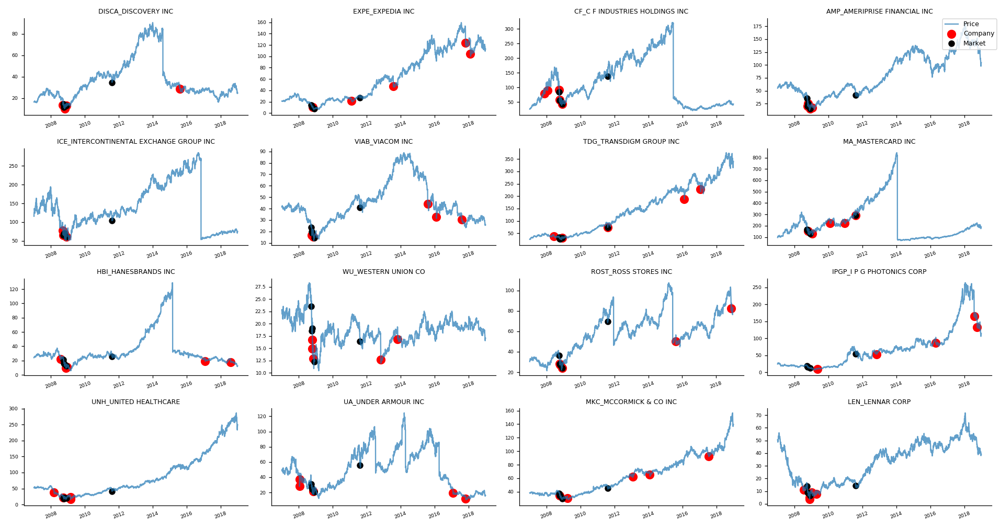

In [83]:
#sup_title_font =15
sub_title_font =8
legend_font =8
axis_font = 6
tick_rotation = 20
black_dot = 2
red_dot = 5

### matrix of subplots
n_cols = 4
n_rows = 4
n_plots = n_cols*n_rows
nloops = int(np.floor(388/n_plots))
temp_matrix = np.array(range(n_plots)).reshape(n_rows,n_cols)

for i in range(nloops):
    nn = len(df_price.columns)
    lower = i*n_plots
    upper = (i+1)*n_plots
    #print(lower, upper)
    temp_list = df_price.columns[lower:upper]
    print('\n\n\n\n\n\n\n\nBatch {}'.format(i))
    
    
    ####----PLOT THE FIGURES---------#####
    ### legend labels
    dot_labels = ['Price', 'Company', 'Market']
    temp_list_of_axis = []
    
    ### instantiage
    fig, ax = plt.subplots(n_cols,n_rows,figsize=(17,9))
    for k in range(n_rows):
        for l in range(n_cols):
            ## indices
            temp_idx = temp_matrix[k,l]
            symbol = temp_list[temp_idx]
            ### company prices, worst 5 dates with worst returns
            temp_worst_prices = worst_days_prices[symbol]
            ### comapny returns, worst 5 systemic dates with worst returns
            temp_worst_prices_sys = worst_days_sys_prices[symbol]

            ### Company Timeseries            
            wt = ax[k, l].plot(dates, df_price[symbol].values, label='Daily Price'.format(symbol), alpha=0.7)            

            ### PLOT: 5 worst company dates
            wc = ax[k, l].scatter(temp_worst_prices.index, temp_worst_prices.values, 
                       color='red', 
                       linewidths=red_dot, 
                       edgecolor='red') 
                       #label='Worst Company Trading')
            ### PLOT: Returns on 5 worst systemic dates 
            wm = ax[k,l].scatter(temp_worst_prices_sys.index, temp_worst_prices_sys.values, 
                       color='black', 
                       linewidths=black_dot, 
                       edgecolor='black') 
                       #label='Worst Market Trading Days')            



            ax[k,l].spines['top'].set_visible(False)
            ax[k,l].spines['right'].set_visible(False)
            ax[k,l].set_title(symbol, fontsize=sub_title_font) 
            #ax[k,l].set_xlabel(fontsize=x_axis_font)
            ax[k,l].tick_params(axis="x", labelsize=axis_font, rotation=tick_rotation)
            ax[k,l].tick_params(axis="y", labelsize=axis_font)
            #ax[k,l].set_ylim([-0.45, 0.45])            
            temp_list_of_axis.append([wc, wm, wt])
         
            
            
    #fig.legend(bbox_to_anchor=(1.1, 1.1), prop={'size':15})
    #fig.suptitle('Daily Returns 2007-2018:\nBatch {}'.format(i), fontsize=sup_title_font)
    fig.subplots_adjust(hspace=0.7)
    leg = fig.legend(temp_list_of_axis, labels=dot_labels, 
               #title='Worst Trading Days', title_fontsize=25, 
               bbox_to_anchor=(1.0, 0.97), 
               prop={'size':legend_font})#, fontsize=sup_title_font)
    leg.set_in_layout(False)
    #plt.tight_layout(pad=0.5, w_pad=5.0, h_pad=0.0)
    plt.tight_layout()
    plt.show()
    #plt.savefig('plots\\timeseries\\price_timeseries_batch{}.png'.format(i+1), dpi=220) 
        
#             for tick in ax[k, l].get_xticklabels():
#                 tick.set_rotation(20)
#                 tick.

### Leftover plots









Batch 0


<IPython.core.display.Javascript object>


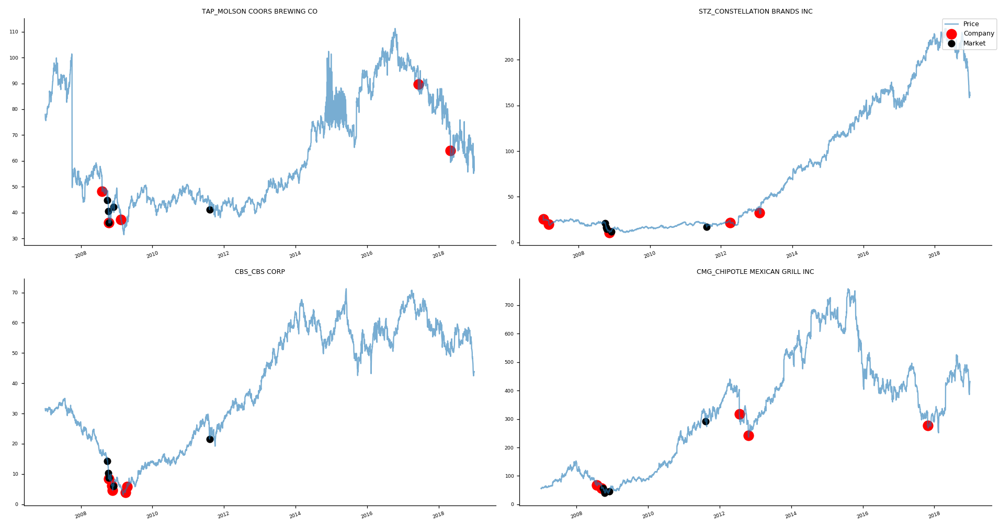

C:\PROGRA1\Anaconda3\lib\site-packages\ipykernel\__main__.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.


In [82]:
#sup_title_font =15
sub_title_font =8
legend_font =8
axis_font = 6
tick_rotation = 20

### matrix of subplots
n_cols = 2
n_rows = 2
n_plots = n_cols*n_rows
nloops = 1
temp_matrix = np.array(range(n_plots)).reshape(n_rows,n_cols)

for i in range(nloops):
    nn = len(df_price.columns)
    #print(lower, upper)
    temp_list = df_returns.columns[-n_plots:]
    print('\n\n\n\n\n\n\n\nBatch {}'.format(i))
    
    
    ####----PLOT THE FIGURES---------#####
    dot_labels = ['Price', 'Company', 'Market']
    temp_list_of_axis = []
    
    fig, ax = plt.subplots(n_cols,n_rows,figsize=(17,9))
    for k in range(n_rows):
        for l in range(n_cols):
            ## indices
            temp_idx = temp_matrix[k,l]
            symbol = temp_list[temp_idx]
            ### company returns, worst 5 dates with worst returns
            temp_worst_price = worst_days_prices[symbol]
            ### comapny returns, worst 5 systemic dates with worst returns
            temp_worst_price_sys = worst_days_sys_prices[symbol]
            
            ### Company Timeseries            
            wt = ax[k, l].plot(dates, df_price[symbol].values, label='Daily Prices'.format(symbol), alpha=0.6)

            ### PLOT: 5 worst company dates
            wc = ax[k, l].scatter(temp_worst_price.index, temp_worst_price.values, 
                       color='red', 
                       linewidths=7, 
                       edgecolor='red', zorder=1) 
                       #label='Worst Company Trading')
            ### PLOT: Returns on 5 worst systemic dates 
            wm = ax[k,l].scatter(temp_worst_price_sys.index, temp_worst_price_sys.values, 
                       color='black', 
                       linewidths=3, 
                       edgecolor='black', zorder=1) 
                       #label='Worst Market Trading Days')            


            ax[k,l].spines['top'].set_visible(False)
            ax[k,l].spines['right'].set_visible(False)
            ax[k,l].set_title(symbol, fontsize=sub_title_font) 
            #ax[k,l].set_xlabel(fontsize=x_axis_font)
            ax[k,l].tick_params(axis="x", labelsize=axis_font, rotation=tick_rotation)
            #ax[k,l].set_ylim([-0.45, 0.3])
            ax[k,l].tick_params(axis="y", labelsize=axis_font)
            temp_list_of_axis.append([wt, wc, wm])
         
            
            
    #fig.legend(bbox_to_anchor=(1.1, 1.1), prop={'size':15})
    #fig.suptitle('Daily Returns 2007-2018:\nBatch {}'.format(i), fontsize=sup_title_font)
    fig.subplots_adjust(hspace=0.7)
    leg = fig.legend(temp_list_of_axis, labels=dot_labels, 
               #title='Worst Trading Days', title_fontsize=25, 
               bbox_to_anchor=(1.0, 0.97), 
               prop={'size':legend_font})#, fontsize=sup_title_font)
    leg.set_in_layout(False)
    #plt.tight_layout(pad=0.5, w_pad=5.0, h_pad=0.0)
    plt.tight_layout()
    plt.show()
    #plt.savefig('plots\\timeseries\\price_timeseries_batch{}.png'.format(i+1), dpi=220) 
    
    
#             for tick in ax[k, l].get_xticklabels():
#                 tick.set_rotation(20)
#                 tick.